In [ ]:
from pathlib import Path
import json
import urllib.request
import matplotlib.pyplot as plt

_TREBL_FIG_DIR = Path.cwd() / 'saved_figures'
_TREBL_FIG_DIR.mkdir(parents=True, exist_ok=True)


def _trebl_notebook_stem():
    try:
        import ipykernel

        connection_file = Path(ipykernel.get_connection_file()).name
        kernel_id = connection_file.split('-', 1)[1].split('.', 1)[0]

        try:
            from notebook import notebookapp

            servers = list(notebookapp.list_running_servers())
        except Exception:
            from jupyter_server import serverapp

            servers = list(serverapp.list_running_servers())

        for srv in servers:
            token = srv.get('token', '')
            api_url = f"{srv['url'].rstrip('/')}/api/sessions"
            if token:
                api_url = f"{api_url}?token={token}"

            with urllib.request.urlopen(api_url, timeout=2) as response:
                sessions = json.loads(response.read().decode('utf-8'))

            for sess in sessions:
                if sess.get('kernel', {}).get('id') == kernel_id:
                    notebook_path = sess.get('notebook', {}).get('path') or sess.get('path', '')
                    raw_stem = Path(notebook_path).stem or 'notebook'
                    safe_stem = ''.join(ch if (ch.isalnum() or ch in {'_', '-'}) else '_' for ch in raw_stem)
                    return safe_stem.strip('_') or 'notebook'
    except Exception:
        pass

    return 'notebook'


if not hasattr(plt, '_trebl_autosave_original_show'):
    plt._trebl_autosave_original_show = plt.show
    plt._trebl_autosave_counter = 1
    plt._trebl_notebook_stem = _trebl_notebook_stem()

    def _trebl_autosave_show(*args, **kwargs):
        for fig_num in plt.get_fignums():
            fig = plt.figure(fig_num)
            stem = f"{plt._trebl_notebook_stem}_figure_{plt._trebl_autosave_counter:04d}"
            fig.savefig(_TREBL_FIG_DIR / f'{stem}.png', dpi=300, bbox_inches='tight')
            fig.savefig(_TREBL_FIG_DIR / f'{stem}.pdf', dpi=300, bbox_inches='tight')
            plt._trebl_autosave_counter += 1
        return plt._trebl_autosave_original_show(*args, **kwargs)

    plt.show = _trebl_autosave_show


In [29]:
import tqdm
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import scipy
import seaborn as sns

In [40]:
exponential_fit = pd.read_csv("/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/ChopTFs_pipeline/speed/exponential_fit_baseline_norm.csv", index_col = 0)
exponential_fit = exponential_fit.rename(columns = {"k" : "speed", "obs_max" : "strength"})
exponential_fit = exponential_fit[["ADseq", "speed", "strength"]]
exponential_fit

,ADseq,speed,strength
0,AAIPENELLDEDTMNAISSLKNDLSNISNSLPAEAPHEIA,0.082813,0.706145
1,AAKRSGAKTIIFPKDNLNDWEELPDNVKEGLEPLAADWYN,0.172300,1.203073
2,AALGICNTRLLYPLEVIDKAFSTTNELAWALANQWSCVNI,0.034284,0.481848
4,AASNSYAIPENELLDEDTMNFISSLKNDLSNISNSLPFEY,0.130303,1.548841
5,AAVPQQNIAPPFLNTNSSATDSNPNTNLEDSLFFDHDLLS,0.128824,1.413739
...,...,...,...
1410,YSNARGSDPSSYAIEGEYKTLATDDLGNILNLNYGETNEV,0.083890,1.192749
1411,YTKGGALFLDNKNLLLDTIKDIENDRLLDLPGIASWHTLK,0.041064,0.868173
1412,YTTLTSPYPMNDILYNMNNPLQSPSPSSVPQNPTINPPIN,0.067066,0.682291
1413,YVPTRNTFNYDVKISNDFFDNGDNLYGNDEEVLFYEDNYN,0.112745,1.591107


In [41]:
from sklearn.linear_model import LinearRegression

# predict speed from strength
# How much of the speed can not be predicted linearly from speed
model = LinearRegression().fit(exponential_fit[['strength']], exponential_fit['speed'])
exponential_fit['speed_resid'] = exponential_fit['speed'] - model.predict(exponential_fit[['strength']])
exponential_fit

,ADseq,speed,strength,speed_resid
0,AAIPENELLDEDTMNAISSLKNDLSNISNSLPAEAPHEIA,0.082813,0.706145,0.018770
1,AAKRSGAKTIIFPKDNLNDWEELPDNVKEGLEPLAADWYN,0.172300,1.203073,0.078859
2,AALGICNTRLLYPLEVIDKAFSTTNELAWALANQWSCVNI,0.034284,0.481848,-0.016490
4,AASNSYAIPENELLDEDTMNFISSLKNDLSNISNSLPFEY,0.130303,1.548841,0.016406
5,AAVPQQNIAPPFLNTNSSATDSNPNTNLEDSLFFDHDLLS,0.128824,1.413739,0.022919
...,...,...,...,...
1410,YSNARGSDPSSYAIEGEYKTLATDDLGNILNLNYGETNEV,0.083890,1.192749,-0.008940
1411,YTKGGALFLDNKNLLLDTIKDIENDRLLDLPGIASWHTLK,0.041064,0.868173,-0.032564
1412,YTTLTSPYPMNDILYNMNNPLQSPSPSSVPQNPTINPPIN,0.067066,0.682291,0.004435
1413,YVPTRNTFNYDVKISNDFFDNGDNLYGNDEEVLFYEDNYN,0.112745,1.591107,-0.003652


Text(0.5, 1.0, 'Chop TFs')

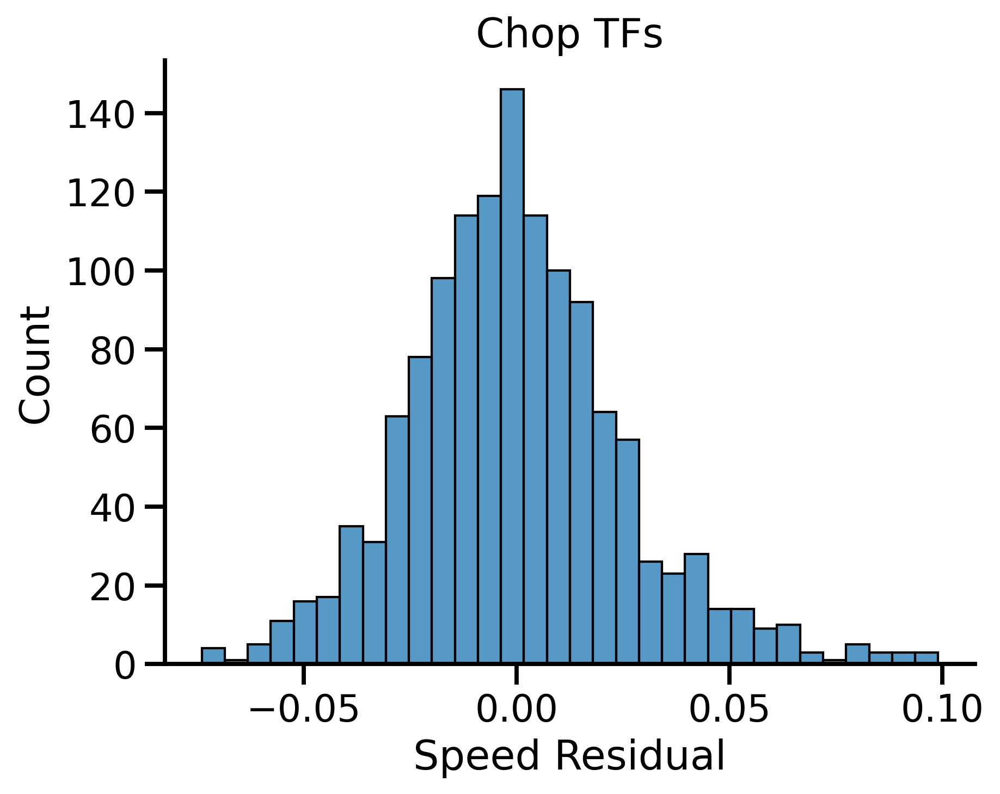

In [42]:
sns.set_context('talk')
plt.figure(dpi = 300)
ax = sns.histplot(data = exponential_fit, x = "speed_resid")
ax.set_xlabel("Speed Residual")
sns.despine()
plt.title("Chop TFs")

In [115]:
from scipy.stats import spearmanr
import pandas as pd

AAs = list("ACDEFGHIKLMNPQRSTVWY")

# --- compute single-AA frequencies ---
for AA in AAs:
    exponential_fit[AA] = exponential_fit[AA] / exponential_fit["ADseq"].str.len()

# --- compute derived features ---
# Net charge
exponential_fit["net\ncharge"] = (
    exponential_fit["R"] + exponential_fit["K"] -
    exponential_fit["D"] - exponential_fit["E"]
)

# Hydrophobic fraction
exponential_fit["prop\nhydrophob"] = (
    exponential_fit["W"] + exponential_fit["F"] +
    exponential_fit["Y"] + exponential_fit["L"]
)

# --- combine all features ---
features = [AA for AA in AAs] + ["net\ncharge", "prop\nhydrophob"]


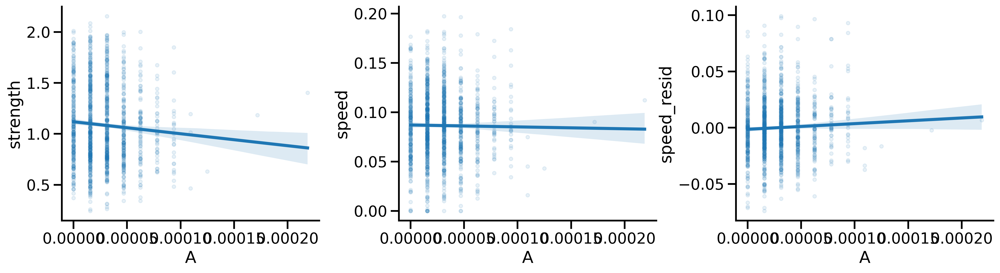

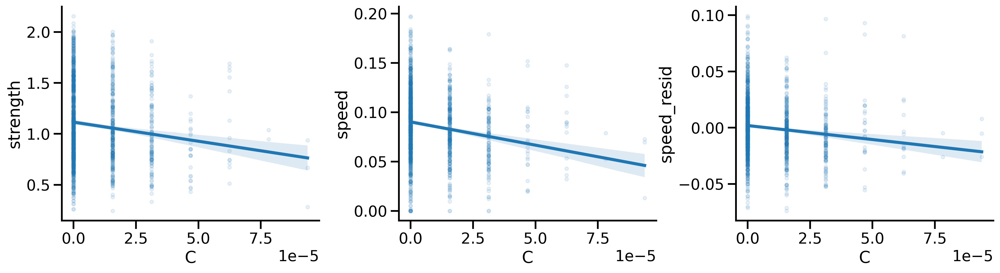

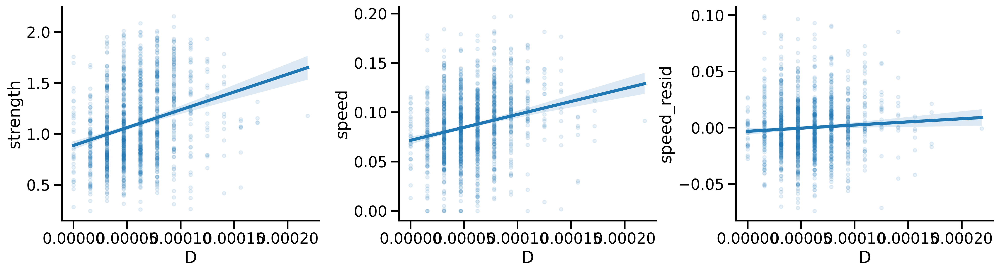

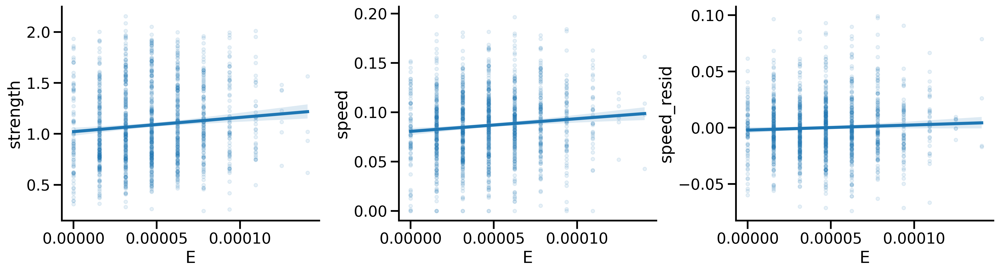

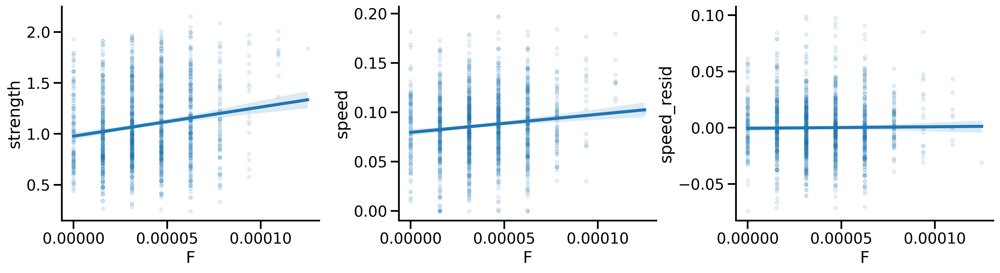

...

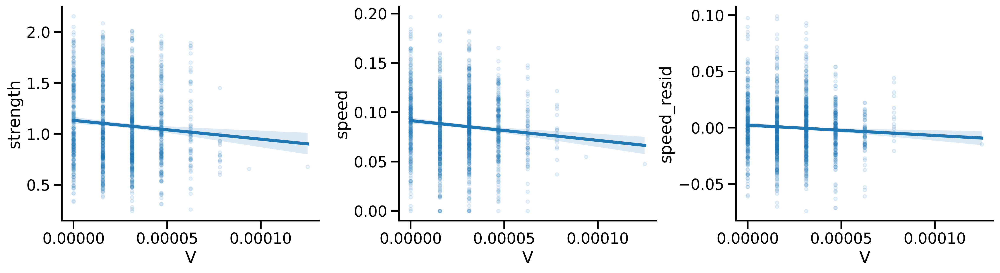

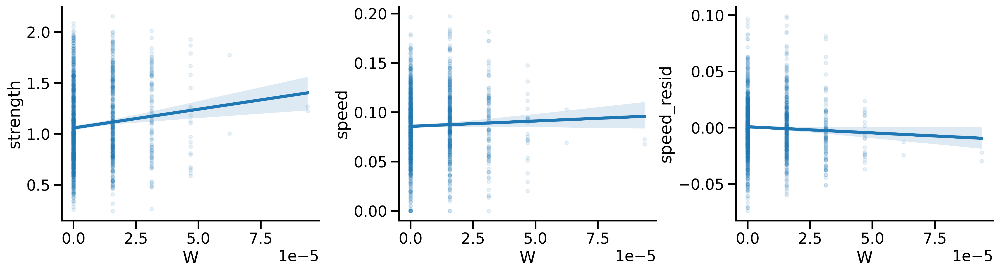

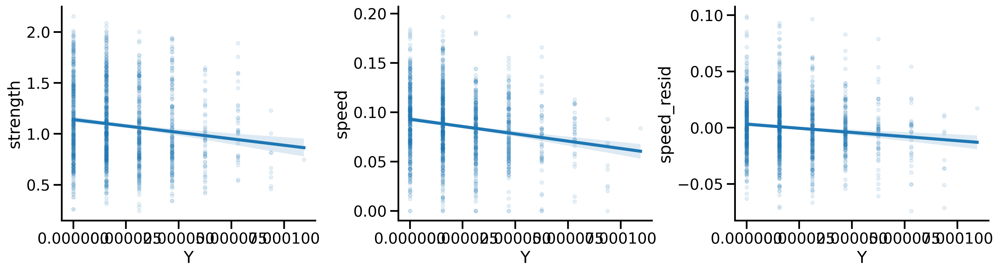

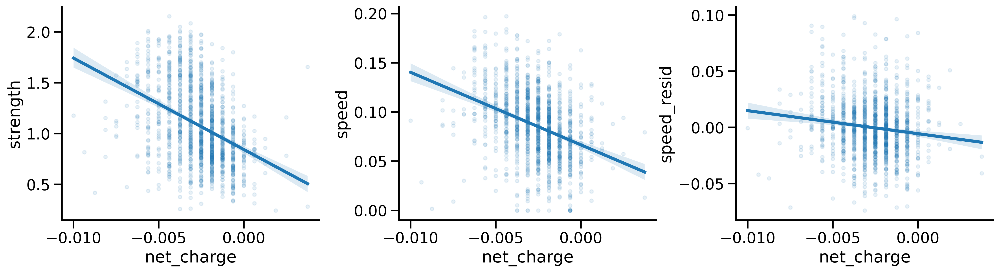

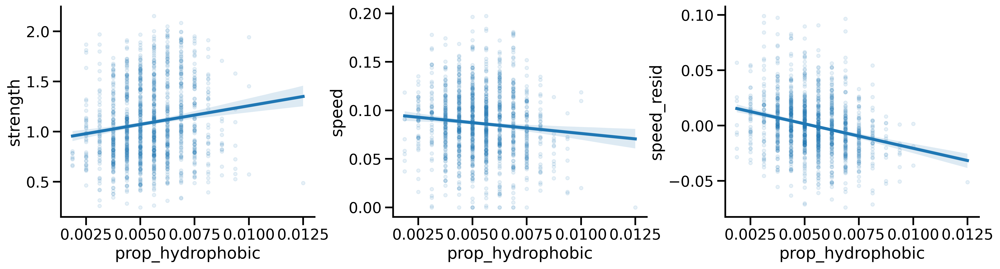

In [107]:
for feature in features:
    fig, axes = plt.subplots(1, 3, figsize=(15, 4), dpi=300)

    scatter_kws = {"alpha":0.1, 's' : 15}
    
    # --- strength ---
    sns.regplot(
        data=exponential_fit,
        x=feature, y='strength',
        ax=axes[0],
        scatter_kws=  scatter_kws# lower transparency
    )

    # --- speed ---
    sns.regplot(
        data=exponential_fit,
        x=feature, y='speed',
        ax=axes[1],
        scatter_kws=scatter_kws
    )

    # --- speed residual ---
    sns.regplot(
        data=exponential_fit,
        x=feature, y='speed_resid',
        ax=axes[2],
        scatter_kws=scatter_kws
    )

    plt.tight_layout(pad=0.1)
    sns.despine()
    plt.show()
scatter_kws = {"alpha": 0.1, "s": 15}  # transparent & small dots

In [123]:
# --- compute correlations ---
results = []
for feat in features:
    r_strength, _ = spearmanr(exponential_fit[feat], exponential_fit['strength'])
    r_speed, _ = spearmanr(exponential_fit[feat], exponential_fit['speed'])
    r_speed_resid, _ = spearmanr(exponential_fit[feat], exponential_fit['speed_resid'])
    
    results.append({
        "feature": feat,
        "Strength": r_strength,
        "Speed": r_speed,
        "Speed Residual": r_speed_resid
    })

summary_df = pd.DataFrame(results)
summary_df = summary_df.sort_values(by='Speed Residual', ascending=False)
summary_df

,feature,Strength,Speed,Speed Residual
15,S,-0.058253,0.063626,0.143159
16,T,0.000993,0.074505,0.096505
11,N,0.087007,0.121453,0.094708
2,D,0.286691,0.248460,0.069664
5,G,0.055323,0.075342,0.063541
12,P,-0.103029,-0.031450,0.047619
0,A,-0.062573,-0.015252,0.035569
3,E,0.110846,0.101651,0.031853
10,M,0.055412,0.046256,0.002831
4,F,0.151156,0.093684,-0.002201


In [125]:
summary_melt = summary_df.melt(
    id_vars="feature", 
    value_vars=["Strength", "Speed", "Speed Residual"],
    var_name="metric", 
    value_name="correlation"
)
summary_melt

,feature,metric,correlation
0,S,Strength,-0.058253
1,T,Strength,0.000993
2,N,Strength,0.087007
3,D,Strength,0.286691
4,G,Strength,0.055323
...,...,...,...
61,Y,Speed Residual,-0.106600
62,net\ncharge,Speed Residual,-0.133651
63,C,Speed Residual,-0.168560
64,L,Speed Residual,-0.209776


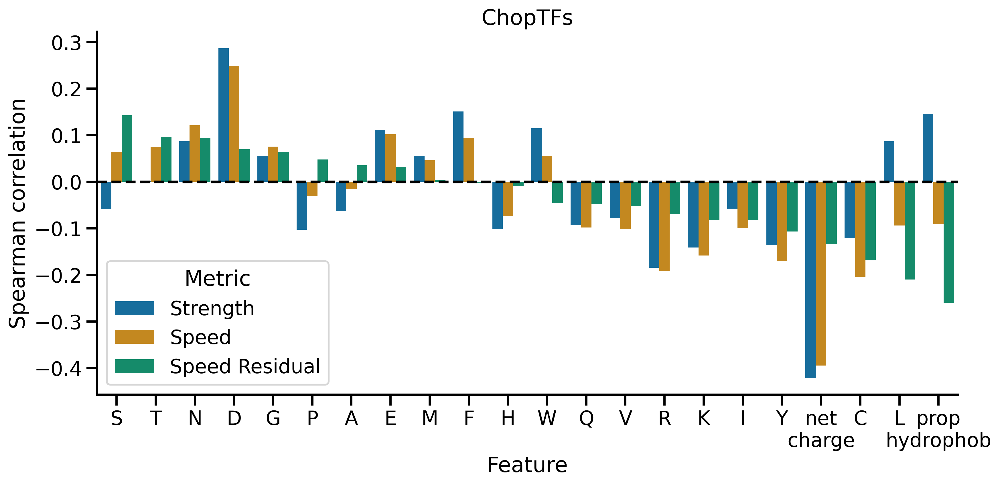

In [127]:
plt.figure(figsize=(12,6), dpi = 300)
sns.barplot(data=summary_melt, x="feature", y="correlation", hue="metric", palette = 'colorblind')
plt.axhline(0, color='k', linestyle='--')
plt.title("ChopTFs")
plt.ylabel("Spearman correlation")
plt.xlabel("Feature")
plt.xticks(rotation=0, ha='center')  # rotate x ticks
plt.legend(title="Metric")
sns.despine()
plt.tight_layout()
plt.show()

Building features...

Speed ~ Strength: r=0.665, p=1.16e-167
Speed residual variance explained by strength: 0.442

Speed: best CV R²=0.182, alpha=323.746

Strength: best CV R²=0.236, alpha=138.950

Speed (residual): best CV R²=0.099, alpha=323.746


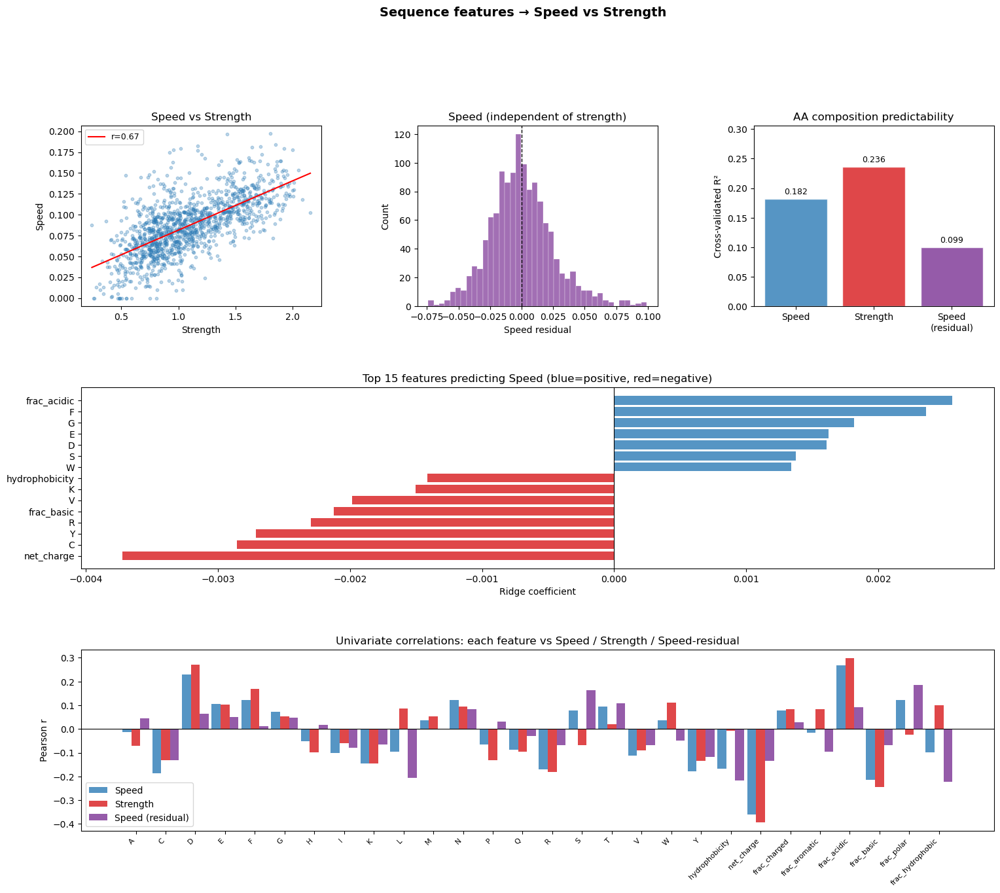


Saved: tf_speed_strength_seq.png

── Feature summary (sorted by |r| with speed residual) ──
                  r_speed  r_strength  r_speed_resid  coef_speed  coef_strength  coef_speed_resid
frac_hydrophobic  -0.0992      0.1012        -0.2230     -0.0005         0.0254           -0.0019
hydrophobicity    -0.1671     -0.0072        -0.2174     -0.0014         0.0056           -0.0017
L                 -0.0963      0.0873        -0.2067     -0.0012         0.0298           -0.0027
frac_polar         0.1223     -0.0235         0.1846      0.0013         0.0018            0.0012
S                  0.0770     -0.0686         0.1642      0.0014        -0.0105            0.0020
net_charge        -0.3616     -0.3939        -0.1334     -0.0037        -0.0501           -0.0009
C                 -0.1865     -0.1321        -0.1321     -0.0029        -0.0230           -0.0016
Y                 -0.1785     -0.1351        -0.1187     -0.0027        -0.0254           -0.0013
T                  0.0935

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

# ── paste your df here, or load from csv ──────────────────────────────────────
df = exponential_fit
# For now, assumes df is already in memory with columns: AD, seq, speed, strength

# ── 1. AMINO ACID COMPOSITION FEATURES ───────────────────────────────────────
AAS = list("ACDEFGHIKLMNPQRSTVWY")

def aa_composition(seq):
    """Fractional amino acid composition (20 features)."""
    counts = {aa: seq.count(aa) / len(seq) for aa in AAS}
    return counts

def aa_physicochemical(seq):
    """Bulk physicochemical properties of the sequence."""
    # Kyte-Doolittle hydrophobicity
    hydro = {'A':1.8,'C':2.5,'D':-3.5,'E':-3.5,'F':2.8,'G':-0.4,
             'H':-3.2,'I':4.5,'K':-3.9,'L':3.8,'M':1.9,'N':-3.5,
             'P':-1.6,'Q':-3.5,'R':-4.5,'S':-0.8,'T':-0.7,'V':4.2,
             'W':-0.9,'Y':-1.3}
    # Charge at pH 7
    charge = {'D':-1,'E':-1,'K':1,'R':1,'H':0.1}
    
    h = np.mean([hydro.get(aa, 0) for aa in seq])
    net_charge = sum(charge.get(aa, 0) for aa in seq)
    frac_charged = sum(aa in 'DEKRH' for aa in seq) / len(seq)
    frac_aromatic = sum(aa in 'FWY' for aa in seq) / len(seq)
    frac_acidic = sum(aa in 'DE' for aa in seq) / len(seq)
    frac_basic = sum(aa in 'KRH' for aa in seq) / len(seq)
    frac_polar = sum(aa in 'NQST' for aa in seq) / len(seq)
    frac_hydrophobic = sum(aa in 'AVILMFW' for aa in seq) / len(seq)
    
    return {
        'hydrophobicity': h,
        'net_charge': net_charge,
        'frac_charged': frac_charged,
        'frac_aromatic': frac_aromatic,
        'frac_acidic': frac_acidic,
        'frac_basic': frac_basic,
        'frac_polar': frac_polar,
        'frac_hydrophobic': frac_hydrophobic,
    }

def build_features(df):
    comp = pd.DataFrame([aa_composition(s) for s in df['ADseq']])
    phys = pd.DataFrame([aa_physicochemical(s) for s in df['ADseq']])
    return pd.concat([comp, phys], axis=1)

# ── 2. BUILD FEATURE MATRIX ───────────────────────────────────────────────────
print("Building features...")
X_df = build_features(df)
X = X_df.values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

speed    = df['speed'].values
strength = df['strength'].values

# ── 3. RESIDUALIZE SPEED ON STRENGTH ─────────────────────────────────────────
slope, intercept, r, p, se = stats.linregress(strength, speed)
speed_resid = speed - (slope * strength + intercept)

print(f"\nSpeed ~ Strength: r={r:.3f}, p={p:.2e}")
print(f"Speed residual variance explained by strength: {r**2:.3f}")

# ── 4. RIDGE REGRESSION: PREDICT SPEED, STRENGTH, SPEED_RESID ────────────────
alphas = np.logspace(-3, 3, 50)

def fit_ridge(X, y, label):
    cv_scores = []
    for a in alphas:
        scores = cross_val_score(Ridge(alpha=a), X, y, cv=5, scoring='r2')
        cv_scores.append(scores.mean())
    best_alpha = alphas[np.argmax(cv_scores)]
    best_r2 = max(cv_scores)
    
    model = Ridge(alpha=best_alpha).fit(X, y)
    coefs = pd.Series(model.coef_, index=X_df.columns).sort_values()
    print(f"\n{label}: best CV R²={best_r2:.3f}, alpha={best_alpha:.3f}")
    return model, coefs, best_r2

model_speed,    coef_speed,    r2_speed    = fit_ridge(X_scaled, speed,       "Speed")
model_strength, coef_strength, r2_strength = fit_ridge(X_scaled, strength,    "Strength")
model_resid,    coef_resid,    r2_resid    = fit_ridge(X_scaled, speed_resid, "Speed (residual)")

# ── 5. UNIVARIATE CORRELATIONS ────────────────────────────────────────────────
uni_speed    = X_df.apply(lambda col: stats.pearsonr(col, speed)[0])
uni_strength = X_df.apply(lambda col: stats.pearsonr(col, strength)[0])
uni_resid    = X_df.apply(lambda col: stats.pearsonr(col, speed_resid)[0])

# ── 6. PLOTS ──────────────────────────────────────────────────────────────────
fig = plt.figure(figsize=(18, 14))
gs = gridspec.GridSpec(3, 3, hspace=0.45, wspace=0.4)

# --- Panel A: Speed vs Strength scatter ---
ax0 = fig.add_subplot(gs[0, 0])
ax0.scatter(strength, speed, alpha=0.3, s=10, color='#2c7bb6')
xline = np.linspace(strength.min(), strength.max(), 100)
ax0.plot(xline, slope * xline + intercept, color='red', lw=1.5, label=f'r={r:.2f}')
ax0.set_xlabel('Strength')
ax0.set_ylabel('Speed')
ax0.set_title('Speed vs Strength')
ax0.legend(fontsize=9)

# --- Panel B: Speed residuals distribution ---
ax1 = fig.add_subplot(gs[0, 1])
ax1.hist(speed_resid, bins=40, color='#7b3294', alpha=0.7, edgecolor='white', lw=0.3)
ax1.axvline(0, color='black', lw=1, ls='--')
ax1.set_xlabel('Speed residual')
ax1.set_ylabel('Count')
ax1.set_title('Speed (independent of strength)')

# --- Panel C: R² summary ---
ax2 = fig.add_subplot(gs[0, 2])
labels = ['Speed', 'Strength', 'Speed\n(residual)']
r2s = [r2_speed, r2_strength, r2_resid]
colors = ['#2c7bb6', '#d7191c', '#7b3294']
bars = ax2.bar(labels, r2s, color=colors, alpha=0.8, edgecolor='white')
ax2.set_ylabel('Cross-validated R²')
ax2.set_title('AA composition predictability')
ax2.set_ylim(0, max(r2s) * 1.3)
for bar, val in zip(bars, r2s):
    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
             f'{val:.3f}', ha='center', va='bottom', fontsize=9)

# --- Panel D: Top coefficients for Speed ---
ax3 = fig.add_subplot(gs[1, :])
top_n = 15
top_idx = coef_speed.abs().nlargest(top_n).index
coef_speed_top = coef_speed[top_idx].sort_values()
colors_bar = ['#2c7bb6' if v > 0 else '#d7191c' for v in coef_speed_top]
ax3.barh(range(len(coef_speed_top)), coef_speed_top.values, color=colors_bar, alpha=0.8)
ax3.set_yticks(range(len(coef_speed_top)))
ax3.set_yticklabels(coef_speed_top.index)
ax3.axvline(0, color='black', lw=0.8)
ax3.set_xlabel('Ridge coefficient')
ax3.set_title(f'Top {top_n} features predicting Speed (blue=positive, red=negative)')

# --- Panel E: Univariate r comparison across all features ---
ax4 = fig.add_subplot(gs[2, :])
x = np.arange(len(uni_speed))
width = 0.3
ax4.bar(x - width, uni_speed.values,    width, label='Speed',            color='#2c7bb6', alpha=0.8)
ax4.bar(x,          uni_strength.values, width, label='Strength',         color='#d7191c', alpha=0.8)
ax4.bar(x + width,  uni_resid.values,    width, label='Speed (residual)', color='#7b3294', alpha=0.8)
ax4.set_xticks(x)
ax4.set_xticklabels(uni_speed.index, rotation=45, ha='right', fontsize=8)
ax4.axhline(0, color='black', lw=0.8)
ax4.set_ylabel('Pearson r')
ax4.set_title('Univariate correlations: each feature vs Speed / Strength / Speed-residual')
ax4.legend()

plt.suptitle('Sequence features → Speed vs Strength', fontsize=14, fontweight='bold', y=1.01)
#plt.savefig('/mnt/user-data/outputs/tf_speed_strength_seq.png', dpi=150, bbox_inches='tight')
plt.show()
print("\nSaved: tf_speed_strength_seq.png")

# ── 7. SUMMARY TABLE ─────────────────────────────────────────────────────────
summary = pd.DataFrame({
    'r_speed':    uni_speed,
    'r_strength': uni_strength,
    'r_speed_resid': uni_resid,
    'coef_speed':    coef_speed,
    'coef_strength': coef_strength,
    'coef_speed_resid': coef_resid,
}).round(4).sort_values('r_speed_resid', key=abs, ascending=False)

print("\n── Feature summary (sorted by |r| with speed residual) ──")
print(summary.to_string())

In [16]:
summary.sort_values(by = "r_speed_resid", ascending = False)

,r_speed,r_strength,r_speed_resid,coef_speed,coef_strength,coef_speed_resid
frac_polar,0.1223,-0.0235,0.1846,0.0013,0.0018,0.0012
S,0.0770,-0.0686,0.1642,0.0014,-0.0105,0.0020
T,0.0935,0.0190,0.1083,0.0013,0.0069,0.0010
frac_acidic,0.2675,0.2990,0.0920,0.0026,0.0315,0.0008
N,0.1234,0.0931,0.0823,0.0005,0.0110,-0.0001
D,0.2287,0.2707,0.0652,0.0016,0.0297,-0.0001
E,0.1054,0.1018,0.0505,0.0016,0.0095,0.0011
G,0.0727,0.0543,0.0489,0.0018,0.0145,0.0010
A,-0.0131,-0.0712,0.0459,-0.0003,-0.0314,0.0013
P,-0.0646,-0.1311,0.0303,-0.0010,-0.0298,0.0006


In [17]:
# How many tiles are in each quadrant?
speed_med    = df['speed'].median()
strength_med = df['strength'].median()

df['quadrant'] = 'slow+weak'
df.loc[(df.speed >  speed_med) & (df.strength >  strength_med), 'quadrant'] = 'fast+strong'
df.loc[(df.speed >  speed_med) & (df.strength <= strength_med), 'quadrant'] = 'fast+weak'
df.loc[(df.speed <= speed_med) & (df.strength >  strength_med), 'quadrant'] = 'slow+strong'

print(df.quadrant.value_counts())

# And how extreme are the off-diagonal tiles?
off_diag = df[df.quadrant.isin(['fast+weak', 'slow+strong'])]
print(off_diag[['speed','strength','quadrant']].describe())

quadrant
slow+weak      486
fast+strong    485
fast+weak      168
slow+strong    168
Name: count, dtype: int64
            speed    strength
count  336.000000  336.000000
mean     0.088983    1.019351
std      0.024924    0.234719
min      0.009583    0.243943
25%      0.075397    0.865309
50%      0.086429    1.018762
75%      0.100615    1.140422
max      0.179063    1.827310


In [19]:
# Are the off-diagonal tiles genuinely extreme, or just slightly off?
# Look at the top/bottom of the speed residual instead — cleaner than quadrants

df['speed_resid'] = speed_resid  # from earlier

# Most discordant tiles
print("=== Fast for their strength ===")
print(df.nlargest(20, 'speed_resid')[['ADseq','speed','strength','speed_resid']])

print("=== Slow for their strength ===")
print(df.nsmallest(20, 'speed_resid')[['ADseq','speed','strength','speed_resid']])

=== Fast for their strength ===
                                         ADseq     speed  strength  \
1330  VLSASSSTWFEPLENIISSASSSSIGSPIEDQFISSNNEE  0.177856  0.955963   
1162  SSTWFEPLENIISSASSSSIGSPIEDQFISSNNEESALFP  0.174353  0.921723   
597   KQCDFMAHPDIRLVQAYLILATTTFPYDEPLLANSLLTQC  0.179063  1.018638   
1294  VADAATSAFASGASHDMGGDCHVNEKCKEYTDCQHFEFLN  0.147219  0.540182   
531   IPELDDAVVESFFSSSTDSTPMFEYENLEDNSKEWTSLFD  0.182204  1.170640   
1141  SQSSGNTGENEEDIAFASGLNGGTFDSMLEALPDDLYFTD  0.196416  1.426719   
503   IFNNDGWDTSLPIDFDFDEFNTETTDFDDFLKLLGDNSPS  0.176662  1.168702   
433   GRWPPLGYEAVSAEQKSAVQLRESQAGASISNNMNFKAND  0.162829  0.951116   
171   DMGGDCHVNEKCKEYTDCQHFEFLNYHNNPSLTKYNDTAT  0.151727  0.785796   
297   EPLENIISSASSSSIGSPIEDQFISSNNEESALFPTDQFF  0.144774  0.672734   
1132  SPPIQTTSTINFNWCFKEEKNNDLKCKWKECPESCSSLFD  0.147567  0.744231   
248   EFDPQVLFSTGTRTVEFMDDQNQPSSASAFLSTARPNHYS  0.144597  0.734298   
1     AAKRSGAKTIIFPKDNLNDWEELPDNVKEGLEPLAADWYN  0.172300  

In [20]:
# Check how many unique "source regions" are in the extremes
# by clustering sequences by overlap / edit distance
# Quick proxy: just look at unique 10-mers in top residuals

top_fast = df.nlargest(40, 'speed_resid')
top_slow = df.nsmallest(40, 'speed_resid')

# How much sequence sharing is there?
def shared_kmers(seqs, k=10):
    from collections import Counter
    all_kmers = []
    for s in seqs:
        all_kmers += [s[i:i+k] for i in range(len(s)-k+1)]
    return Counter(all_kmers).most_common(10)

print("Fast: most shared 10-mers:")
print(shared_kmers(top_fast['ADseq']))
print("\nSlow: most shared 10-mers:")
print(shared_kmers(top_slow['ADseq']))

Fast: most shared 10-mers:
[('SSSSIGSPIE', 5), ('SSSIGSPIED', 5), ('SSIGSPIEDQ', 5), ('SIGSPIEDQF', 5), ('IGSPIEDQFI', 5), ('GSPIEDQFIS', 5), ('SSTWFEPLEN', 4), ('EPLENIISSA', 4), ('PLENIISSAS', 4), ('LENIISSASS', 4)]

Slow: most shared 10-mers:
[('GACNEINVIL', 3), ('VKEVYNPEDL', 2), ('KEVYNPEDLY', 2), ('EVYNPEDLYH', 2), ('VYNPEDLYHL', 2), ('YNPEDLYHLR', 2), ('NPEDLYHLRI', 2), ('PEDLYHLRIL', 2), ('EDLYHLRILN', 2), ('DLYHLRILNS', 2)]


In [21]:
from sklearn.cluster import AgglomerativeClustering
import numpy as np

def seq_similarity(s1, s2, k=10):
    """Jaccard similarity of k-mer sets."""
    k1 = set(s1[i:i+k] for i in range(len(s1)-k+1))
    k2 = set(s2[i:i+k] for i in range(len(s2)-k+1))
    return len(k1 & k2) / len(k1 | k2)

# Build pairwise distance matrix (can be slow for 1415 seqs — subsample if needed)
seqs = df['ADseq'].tolist()
n = len(seqs)
print(f"Building {n}x{n} distance matrix...")

D = np.zeros((n, n))
for i in range(n):
    for j in range(i+1, n):
        sim = seq_similarity(seqs[i], seqs[j])
        D[i,j] = D[j,i] = 1 - sim

print("Clustering...")
clust = AgglomerativeClustering(n_clusters=None, distance_threshold=0.5, 
                                 metric='precomputed', linkage='average')
labels = clust.fit_predict(D)
df['cluster'] = labels

n_clusters = len(np.unique(labels))
print(f"\nTotal tiles: {n}")
print(f"Unique clusters (independent source regions): {n_clusters}")
print(f"\nCluster size distribution:")
print(df['cluster'].value_counts().describe())

Building 1307x1307 distance matrix...
Clustering...

Total tiles: 1307
Unique clusters (independent source regions): 687

Cluster size distribution:
count    687.000000
mean       1.902475
std        0.975252
min        1.000000
25%        1.000000
50%        2.000000
75%        3.000000
max        6.000000
Name: count, dtype: float64


In [23]:
# Take one representative per cluster (the one closest to cluster mean speed/strength)
df_dedup = (df.groupby('cluster')
              .apply(lambda g: g.loc[(g[['speed','strength']] - g[['speed','strength']].mean()).pow(2).sum(axis=1).idxmin()])
              .reset_index(drop=True))

print(f"Deduplicated: {len(df_dedup)} independent ADs")
print(f"Speed~Strength correlation: {df_dedup[['speed','strength']].corr().iloc[0,1]:.3f}")

# Rerun ridge regression on deduplicated data
from scipy import stats
from sklearn.linear_model import Ridge
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
import numpy as np

X_dedup = build_features(df_dedup)
X_dedup_scaled = StandardScaler().fit_transform(X_dedup)

speed_d    = df_dedup['speed'].values
strength_d = df_dedup['strength'].values

slope, intercept, r, p, _ = stats.linregress(strength_d, speed_d)
speed_resid_d = speed_d - (slope * strength_d + intercept)

print(f"Speed~Strength r={r:.3f}")

for y, label in [(speed_d, 'Speed'), (strength_d, 'Strength'), (speed_resid_d, 'Speed residual')]:
    scores = cross_val_score(Ridge(), X_dedup_scaled, y, cv=5, scoring='r2')
    print(f"{label}: CV R²={scores.mean():.3f}")

Deduplicated: 687 independent ADs
Speed~Strength correlation: 0.660
Speed~Strength r=0.660
Speed: CV R²=0.133
Strength: CV R²=0.178
Speed residual: CV R²=0.067
